## Colorado: Matching the Census Blocks to DOC Facilities

##### Overview

This notebook was used to help identify the Census Blocks where incarcerated facilities are located. Using the Colorado Department of Corrections' population counts included in the Colorado Redistricting README, I searched through the census data to match the census block to facility.

In the Colorado Census data, I looked up the largest 50 incarceration facilities by population (P0050003) beginning with the most populated. I used the GPS Coordinates from the census entry to search in Google Maps and identify the facility to match with DOC's count.  

-----

##### Imports

In [1]:
# Necessary imports
import pandas as pd
from plotnine import *

# I don't think we use these?
from mizani.breaks import date_breaks
from mizani.formatters import date_format

/Users/sm/.pyenv/versions/3.10.0/lib/python3.10/site-packages/pandas/compat/__init__.py:124: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


In [2]:
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

%matplotlib inline  
from matplotlib import rcParams
rcParams['figure.figsize'] = (16, 100)

import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore") # Ignore all warnings
# warnings.filterwarnings("ignore", category=RRuntimeWarning) # Show some warnings

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, HTML

In [3]:
%%javascript
// Disable auto-scrolling
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [66]:
%%R

# My commonly used R imports

require('ggplot2')
require('readr')
require('extrafont')
require('dplyr')
require('reshape2')
require('explore')
require('tidyr')
require('forcats')
require('knitr')
require('ragg')
require('palmerpenguins')
# require('theme538')

R[write to console]: Loading required package: ragg



In [5]:
df = pd.DataFrame(
    np.random.randint(0,100,size=(100, 2)), columns=list('AB'))
df.head()

,A,B
0,41,10
1,55,31
2,0,20
3,83,20
4,32,64


In [6]:
# %%R -i df

# # EXAMPLE R CELL
# df
# plt <- ggplot(df) +
#     geom_point(aes(A,B))

# plt

In [7]:
pd.set_option("display.max_columns", None)

##### Importing Merged CSV from Output of Census Chaos notebook

Colorado

In [8]:
df_co = pd.read_csv("..//data//processed//merged//output_co_merged.csv", encoding="utf-8")
df_co.head(3)

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
0,PLST,CO,80010078011000,1,7801,1,1000,20912,Block 1000,39.742879,-104.866410,120,120,82,0,0,0,80010078011000,Adams,123,3,123
1,PLST,CO,80010078011001,1,7801,1,1001,20185,Block 1001,39.742879,-104.867597,156,156,120,0,0,0,80010078011001,Adams,156,0,156
2,PLST,CO,80010078011002,1,7801,1,1002,20340,Block 1002,39.742880,-104.868770,234,234,177,0,0,0,80010078011002,Adams,238,4,238


In [9]:
df_co.query("P0020001 == 0").sort_values(by="dif_pop", ascending = False).head(10)

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
96915,PLST,CO,80770003001014,77,300,1,1014,17330,Block 1014,39.070859,-108.565311,0,0,0,0,0,0,80770003001014,Mesa,13,13,13
13466,PLST,CO,80050074001008,5,7400,1,1008,20210,Block 1008,39.735571,-104.860573,0,0,0,0,0,0,80050074001008,Arapahoe,10,10,10
11893,PLST,CO,80050068154018,5,6815,4,4018,77230,Block 4018,39.583438,-104.874800,0,0,0,0,0,0,80050068154018,Arapahoe,8,8,8
61196,PLST,CO,80410063021008,41,6302,1,1008,7530,Block 1008,38.818317,-104.753702,0,0,0,0,0,0,80410063021008,El Paso,6,6,6
77166,PLST,CO,80590116012002,59,11601,2,2002,15486,Block 2002,39.725489,-105.069163,0,0,0,0,0,0,80590116012002,Jefferson,6,6,6
131332,PLST,CO,81230012011004,123,1201,1,1004,63640,Block 1004,40.421794,-104.723960,0,0,0,0,0,0,81230012011004,Weld,5,5,5
4739,PLST,CO,80010087061016,1,8706,1,1016,13292,Block 1016,39.827723,-104.912710,0,0,0,0,0,0,80010087061016,Adams,5,5,5
61193,PLST,CO,80410063021005,41,6302,1,1005,27927,Block 1005,38.820795,-104.753712,0,0,0,0,0,0,80410063021005,El Paso,5,5,5
53699,PLST,CO,80410023001022,41,2300,1,1022,22698,Block 1022,38.833108,-104.822682,0,0,0,0,0,0,80410023001022,El Paso,4,4,4
8895,PLST,CO,80039602013037,3,960201,3,3037,17204,Block 3037,37.467642,-105.867968,0,0,0,0,0,0,80039602013037,Alamosa,4,4,4


#### Importing Table copied from README file with DOC count — Colorado Independent Redistricting Commissions Staff

Source: Memo Incarcerated Persons Adjustments_Aug_6_2021_Legislative_Commission.pdf

In [10]:
df_co_readme = pd.read_csv("..//data//handmade//readmes//co-readme-incarcerated-persons-adjustments-08-06-2021.csv", encoding="utf-8")
df_co_readme

,Facility,County,Total
0,ARKANSAS VALLEY CORRECTIONAL FACILITY,Crowley,"1,059"
1,ARROWHEAD CORRECTIONAL CENTER,Fremont,513
2,BENT COUNTY CORRECTIONAL FACILITY,Bent,"1,382"
3,BUENA VISTA CORRECTIONAL COMPLEX,Chaffee,908
4,BUENA VISTA MINIMUM CENTER,Chaffee,290
5,BUENA VISTA TRANSITIONAL WORK CENTER,Chaffee,10
6,CENTENNIAL CORRECTIONAL FACILITY,Fremont,403
7,COLORADO CORRECTIONAL CENTER (CAMP GEORGE WEST),Jefferson,123
8,COLORADO STATE PENITENTIARY,Fremont,706
9,COLORADO TERRITORIAL CORRECTIONAL FACILITY,Fremont,910


### Identifying Facilities in Census Blocks 

In [11]:
df_co.query("P0050003 > 0").sort_values(by="P0050003", ascending  = False).head(3)

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65245,PLST,CO,80439802001000,43,980200,1,1000,2173673,Block 1000,38.359615,-105.097914,2532,2532,2532,2532,2532,0,80439802001000,Fremont,2532,0,2532
96619,PLST,CO,80759664001238,75,966400,1,1238,631605,Block 1238,40.611755,-103.161651,2436,2436,2436,2436,2436,0,80759664001238,Logan,486,-1950,486
31481,PLST,CO,80259696012045,25,969601,2,2045,472181,Block 2045,38.158903,-103.956907,1776,1776,1776,1776,1776,0,80259696012045,Crowley,316,-1460,316


In [12]:
df_co.query("GEOCODE == 80439802001000")

# (38.359615, -105.097914)  is  United States Penitentiary, Florence is a Federal Penitentiary
# https://www.google.com/maps/place/38%C2%B021'34.6%22N+105%C2%B005'52.5%22W/@38.3600901,-105.100298,1452m/data=!3m1!1e3!4m5!3m4!1s0x0:0xfde45f72ae14668d!8m2!3d38.359615!4d-105.097914

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65245,PLST,CO,80439802001000,43,980200,1,1000,2173673,Block 1000,38.359615,-105.097914,2532,2532,2532,2532,2532,0,80439802001000,Fremont,2532,0,2532


In [13]:
df_co.query("GEOCODE == 80759664001238")

# (40.611755, -103.161651) is STERLING CORRECTIONAL FACILITY
# https://www.google.com/maps/place/40%C2%B036'42.3%22N+103%C2%B009'41.9%22W/@40.611755,-103.161651,17z/data=!3m1!4b1!4m5!3m4!1s0x0:0x1551f7d3db1c9628!8m2!3d40.611755!4d-103.161651

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
96619,PLST,CO,80759664001238,75,966400,1,1238,631605,Block 1238,40.611755,-103.161651,2436,2436,2436,2436,2436,0,80759664001238,Logan,486,-1950,486


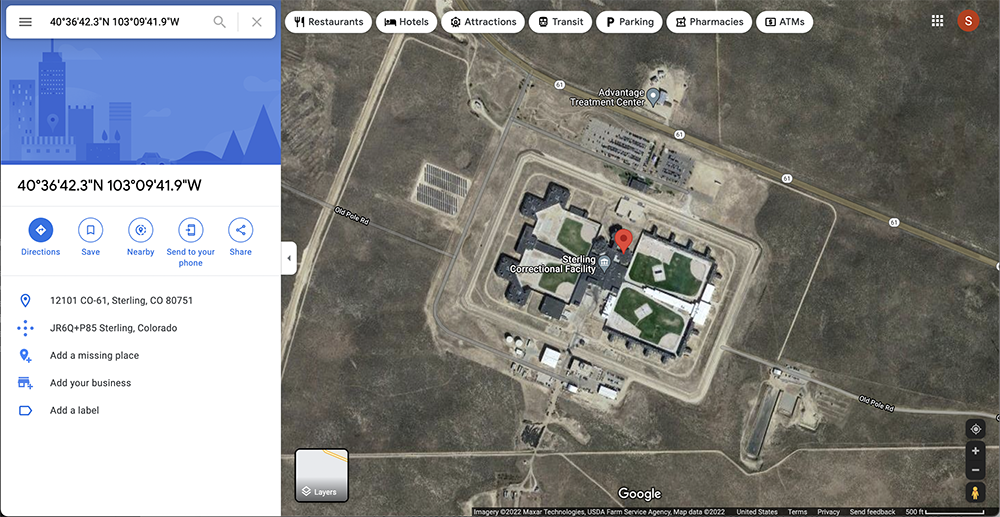

In [14]:
df_co.query("GEOCODE == 80259696012045")

# (38.158903, -103.956907) is Crowley County Correctional
# https://www.google.com/maps/place/38%C2%B009'32.1%22N+103%C2%B057'24.9%22W/@38.158903,-103.9590957,728m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x1936f5d5102229df!8m2!3d38.158903!4d-103.956907

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
31481,PLST,CO,80259696012045,25,969601,2,2045,472181,Block 2045,38.158903,-103.956907,1776,1776,1776,1776,1776,0,80259696012045,Crowley,316,-1460,316


In [15]:
df_co.query("GEOCODE == 80439803001008")

# (38.423025, -105.154641) is FREMONT CORRECTIONAL FACILITY (capacity: 1661)
# https://www.google.com/maps/place/38%C2%B025'22.9%22N+105%C2%B009'16.7%22W/@38.5237868,-105.4138604,72841m/data=!3m1!1e3!4m5!3m4!1s0x0:0x510993cd473e0444!8m2!3d38.423025!4d-105.154641

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65257,PLST,CO,80439803001008,43,980300,1,1008,1717061,Block 1008,38.423025,-105.154641,1419,1419,1419,1419,1419,0,80439803001008,Fremont,106,-1313,106


Sometimes the correctional facility is harder to discern when multiple are in such close proximity as is the case with Fremont Correctional Facility and Centennial Correctional Facility

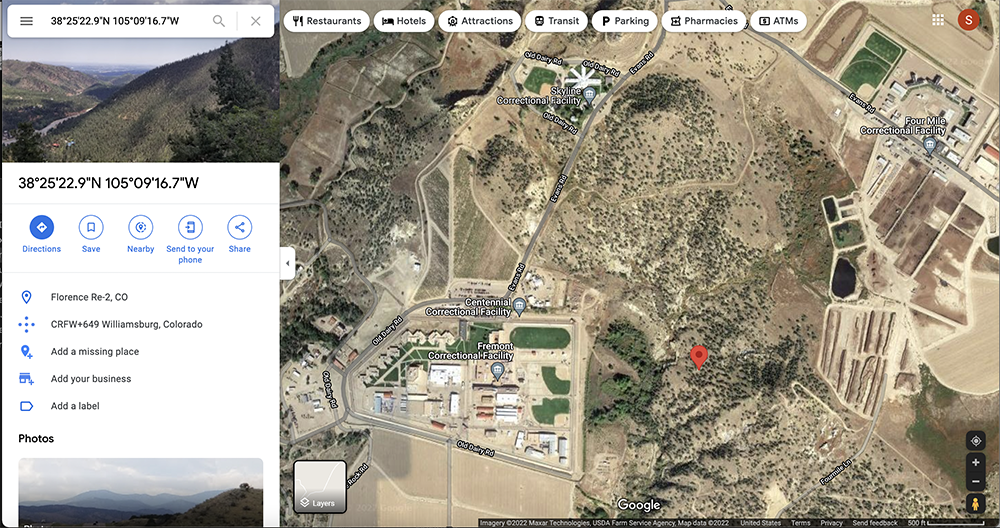

In [16]:
df_co.query("GEOCODE == 80410045011014")

# (38.79012, -104.780327) is the El Paso County Jail?
# https://www.google.com/maps/place/38%C2%B047'24.4%22N+104%C2%B046'49.2%22W/@38.7876709,-104.7838428,1355m/data=!3m1!1e3!4m5!3m4!1s0x0:0x4c12ba5ff40ff3c9!8m2!3d38.79012!4d-104.780327

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
57267,PLST,CO,80410045011014,41,4501,1,1014,320356,Block 1014,38.79012,-104.780327,1208,1208,1208,1208,1208,0,80410045011014,El Paso,1216,8,1216


In [17]:
df_co.query("GEOCODE == 80119667011031")

# (38.064394, -103.197027) is BENT COUNTY CORRECTIONAL FACILITY
# https://www.google.com/maps/place/38%C2%B003'51.8%22N+103%C2%B011'49.3%22W/@38.063124,-103.2086369,2469m/data=!3m1!1e3!4m5!3m4!1s0x0:0xdcce5e8a4607e962!8m2!3d38.064394!4d-103.197027

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
18716,PLST,CO,80119667011031,11,966701,1,1031,502018,Block 1031,38.064394,-103.197027,1224,1224,1212,1202,1202,0,80119667011031,Bent,73,-1151,73


In [18]:
df_co.query("GEOCODE == 80150004021064")

# (38.817104, -106.118779) is BUENA VISTA CORRECTIONAL COMPLEX and/or BUENA VISTA MINIMUM CENTER AND/OR BUENA VISTA TRANSITIONAL WORK CENTER?
# https://www.google.com/maps/place/38%C2%B049'01.6%22N+106%C2%B007'07.6%22W/@38.81902,-106.1208221,1493m/data=!3m1!1e3!4m5!3m4!1s0x0:0xa8f36eebe1e85c9c!8m2!3d38.817104!4d-106.118779

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
27389,PLST,CO,80150004021064,15,402,1,1064,212354,Block 1064,38.817104,-106.118779,1190,1190,1190,1190,1190,0,80150004021064,Chaffee,188,-1002,188


In [19]:
df_co.query("GEOCODE == 80599804001000")

# (39.641789, -105.101075) is Englewood Federal Correctional Institution
# https://www.google.com/maps/place/39%C2%B038'30.4%22N+105%C2%B006'03.9%22W/@39.641215,-105.1066966,2016m/data=!3m1!1e3!4m5!3m4!1s0x0:0xb05d7541fe007761!8m2!3d39.641789!4d-105.101075

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
80964,PLST,CO,80599804001000,59,980400,1,1000,499611,Block 1000,39.641789,-105.101075,1109,1109,1102,1091,1091,0,80599804001000,Jefferson,1109,0,1109


In [20]:
df_co.query("GEOCODE == 80259696021050")

# (38.192536, -103.841322) is ARKANSAS VALLEY CORRECTIONAL FACILITY
# https://www.google.com/maps/place/38%C2%B011'33.1%22N+103%C2%B050'28.8%22W/@38.192536,-103.8435107,728m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xa4aa7c73692420d1!8m2!3d38.192536!4d-103.841322

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
31548,PLST,CO,80259696021050,25,969602,1,1050,403370,Block 1050,38.192536,-103.841322,1063,1063,1063,1063,1063,0,80259696021050,Crowley,201,-862,201


In [21]:
df_co.query("GEOCODE == 80310041101002")

# (39.765165, -104.861804) is DENVER WOMENS CORRECTIONAL FACILITY
# https://www.google.com/maps/place/39%C2%B045'54.6%22N+104%C2%B051'42.5%22W/@39.767209,-104.8658241,1301m/data=!3m1!1e3!4m5!3m4!1s0x0:0x3e88d50e2ffe4724!8m2!3d39.765165!4d-104.861804

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
39278,PLST,CO,80310041101002,31,4110,1,1002,145098,Block 1002,39.765165,-104.861804,938,938,938,938,938,0,80310041101002,Denver,170,-768,170


In [22]:
df_co.query("GEOCODE == 80739617002061")

# (39.218744, -103.691289) is LIMON CORRECTIONAL FACILITY
# https://www.google.com/maps/place/39%C2%B013'07.5%22N+103%C2%B041'28.6%22W/@39.2196272,-103.6973475,1791m/data=!3m1!1e3!4m5!3m4!1s0x0:0x9628c6d0a0bb8ff7!8m2!3d39.218744!4d-103.691289

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
94493,PLST,CO,80739617002061,73,961700,2,2061,634376,Block 2061,39.218744,-103.691289,904,904,904,904,904,0,80739617002061,Lincoln,182,-722,182


In [23]:
df_co.query("GEOCODE == 80050068642009")

# (39.582311, -104.833645) is Arapahoe County Correctional Facility (jail? detention center?)
# https://www.google.com/maps/place/39%C2%B034'56.3%22N+104%C2%B050'01.1%22W/@39.582311,-104.8358337,713m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x48f5d9162750e326!8m2!3d39.582311!4d-104.833645
# https://www.arapahoegov.com/1175/Inmate-Charges-and-Bonds

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
12226,PLST,CO,80050068642009,5,6864,2,2009,334777,Block 2009,39.582311,-104.833645,828,828,789,811,777,34,80050068642009,Arapahoe,829,1,829


In [24]:
df_co.query("GEOCODE == 80690016051005")

# (40.55975, -105.029578) is Larimer County Jail?
# https://www.google.com/maps/place/40%C2%B033'35.1%22N+105%C2%B001'46.5%22W/@40.55975,-105.0317667,703m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x28cd716f76de24a3!8m2!3d40.55975!4d-105.029578

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
87355,PLST,CO,80690016051005,69,1605,1,1005,402064,Block 1005,40.55975,-105.029578,743,743,743,743,743,0,80690016051005,Larimer,775,32,775


In [25]:
df_co.query("GEOCODE == 80310020001007")

# (39.739233, -104.994106) is Denver City Jail
# https://www.google.com/maps/place/39%C2%B044'21.2%22N+104%C2%B059'38.8%22W/@39.739233,-104.9962947,712m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x3843d33de528c957!8m2!3d39.739233!4d-104.994106

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
35974,PLST,CO,80310020001007,31,2000,1,1007,35275,Block 1007,39.739233,-104.994106,734,734,734,734,734,0,80310020001007,Denver,738,4,738


In [26]:
df_co.query("GEOCODE == 80590100011005")

# (39.731094, -105.201785) is Jefferson County Jail (Detention Facility)
# https://www.google.com/maps/place/39%C2%B043'51.9%22N+105%C2%B012'06.4%22W/@39.731094,-105.2039737,712m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x86c182b8990a8658!8m2!3d39.731094!4d-105.201785

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
74570,PLST,CO,80590100011005,59,10001,1,1005,153411,Block 1005,39.731094,-105.201785,731,731,731,731,731,0,80590100011005,Jefferson,732,1,732


In [27]:
df_co.query("GEOCODE == 80439803001005")

# (38.440661, -105.157668) is COLORADO STATE PENITENTIARY
# https://www.google.com/maps/place/38%C2%B026'27.4%22N+105%C2%B009'27.5%22W/@38.4407541,-105.159113,482m/data=!3m1!1e3!4m13!1m7!3m6!1s0x0:0x959c83085b9570d3!2zMzjCsDI2JzI2LjQiTiAxMDXCsDA5JzI3LjYiVw!3b1!8m2!3d38.440661!4d-105.157668!3m4!1s0x0:0x5ff207dc14510627!8m2!3d38.4407249!4d-105.1579681

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65254,PLST,CO,80439803001005,43,980300,1,1005,100077,Block 1005,38.440661,-105.157668,705,705,705,705,705,0,80439803001005,Fremont,149,-556,149


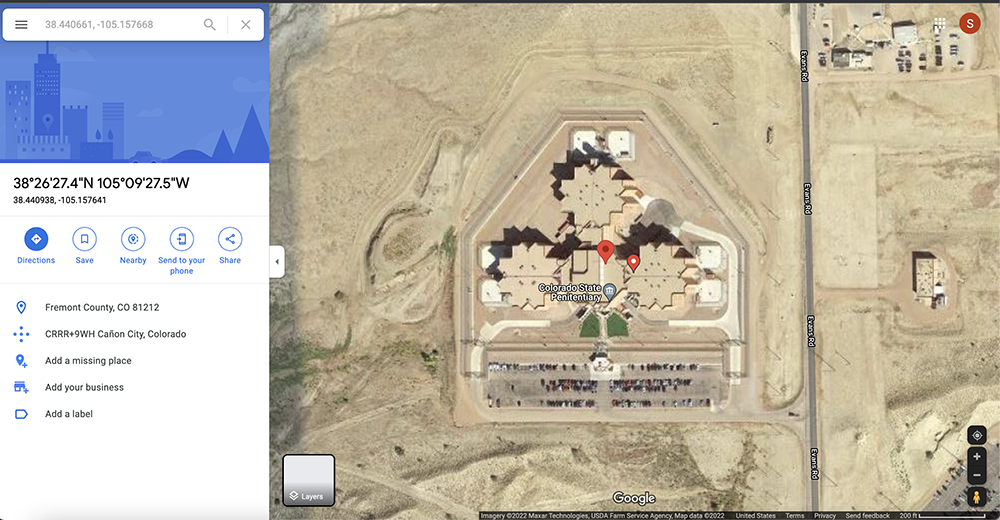

In [28]:
df_co.query("GEOCODE == 80310041101000")

# (39.766801, -104.859315) is DENVER RECEPTION AND DIAGNOSTIC CENTER
# https://www.google.com/maps/place/39%C2%B046'00.5%22N+104%C2%B051'33.5%22W/@39.7671052,-104.8613296,466m/data=!3m1!1e3!4m5!3m4!1s0x0:0x5af09ace9cbb55dd!8m2!3d39.766801!4d-104.859315

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
39276,PLST,CO,80310041101000,31,4110,1,1000,138071,Block 1000,39.766801,-104.859315,651,651,651,651,651,0,80310041101000,Denver,275,-376,275


In [29]:
df_co.query("GEOCODE == 80010086041009")

# (39.990425, -104.797719) is Adams County Sheriff's Detention Facility
# https://www.google.com/maps/place/39%C2%B059'25.5%22N+104%C2%B047'51.8%22W/@39.990425,-104.799913,709m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xd68a895c104309c6!8m2!3d39.990425!4d-104.797719

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
4409,PLST,CO,80010086041009,1,8604,1,1009,218600,Block 1009,39.990425,-104.797719,670,670,646,670,645,25,80010086041009,Adams,680,10,680


In [30]:
df_co.query("GEOCODE == 81230006001012")

# (40.451152, -104.710717) is Weld County Sheriff North Jail Complex
# https://www.google.com/maps/place/40%C2%B027'04.2%22N+104%C2%B042'38.6%22W/@40.4512853,-104.7108394,394m/data=!3m1!1e3!4m5!3m4!1s0x0:0xa2fa27a7c718e5fa!8m2!3d40.451152!4d-104.710717

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
130436,PLST,CO,81230006001012,123,600,1,1012,151854,Block 1012,40.451152,-104.710717,683,683,619,683,610,73,81230006001012,Weld,688,5,688


In [31]:
df_co.query("GEOCODE == 80010082003005")

# (39.760571, -104.849492) is the Aurora ICE Processing Center 
# https://www.google.com/maps/place/39%C2%B045'38.1%22N+104%C2%B050'58.2%22W/@39.760571,-104.8516807,712m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x33e91bac527d7369!8m2!3d39.760571!4d-104.849492

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
352,PLST,CO,80010082003005,1,8200,3,3005,73806,Block 3005,39.760571,-104.849492,588,588,588,588,588,0,80010082003005,Adams,588,0,588


While not labeled on Google Maps, looking at Street View makes it clear this is the Aurora ICE Processing Center

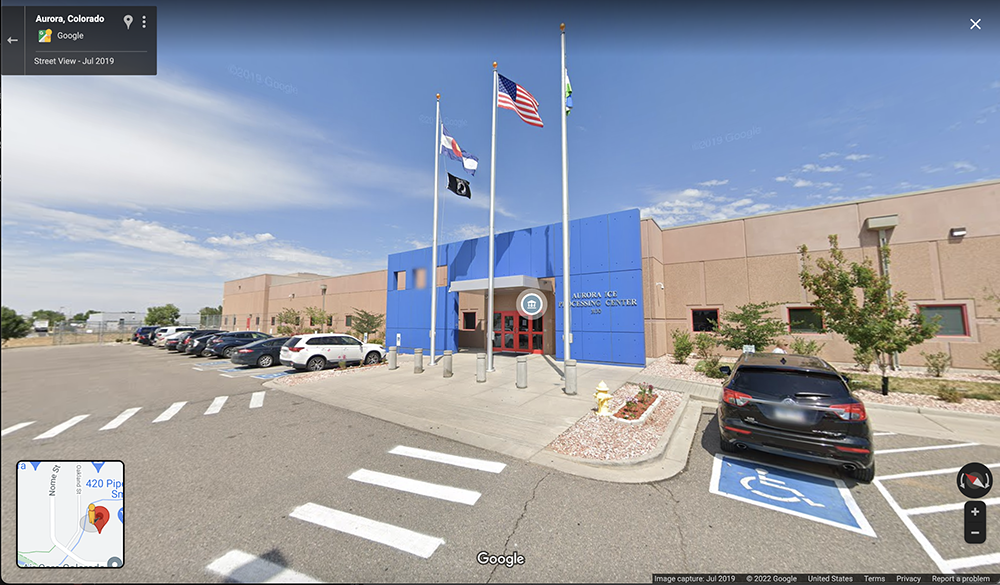

In [32]:
df_co.query("GEOCODE == 80439801001002")

# (38.437664, -105.248566) is COLORADO TERRITORIAL CORRECTIONAL FACILITY
# https://www.google.com/maps/place/38%C2%B026'15.6%22N+105%C2%B014'54.8%22W/@38.437664,-105.25076,725m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xd7cb26b2d6fb7aa1!8m2!3d38.437664!4d-105.248566

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65243,PLST,CO,80439801001002,43,980100,1,1002,109012,Block 1002,38.437664,-105.248566,564,564,564,564,564,0,80439801001002,Fremont,-165,-729,-165


In [33]:
df_co.query("GEOCODE == 81010003001003")

# (38.283048, -104.629003) is LA VISTA CORRECTIONAL FACILITY
# https://www.google.com/maps/place/38%C2%B016'59.0%22N+104%C2%B037'44.4%22W/@38.283048,-104.631197,727m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x4ff66bc9caeb4371!8m2!3d38.283048!4d-104.629003

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
115136,PLST,CO,81010003001003,101,300,1,1003,55536,Block 1003,38.283048,-104.629003,549,549,549,549,549,0,81010003001003,Pueblo,-2,-551,-2


In [34]:
df_co.query("GEOCODE == 80439803001007")

# (38.43517, -105.159009) is ARROWHEAD CORRECTIONAL CENTER
# https://www.google.com/maps/place/38%C2%B026'06.6%22N+105%C2%B009'32.4%22W/@38.43517,-105.161203,725m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x26683db2e50b571!8m2!3d38.43517!4d-105.159009

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65256,PLST,CO,80439803001007,43,980300,1,1007,157426,Block 1007,38.43517,-105.159009,512,512,512,512,512,0,80439803001007,Fremont,88,-424,88


In [35]:
df_co.query("GEOCODE == 80299648003001")

# (38.709194, -108.149789) is DELTA CORRECTIONAL CENTER	
# https://www.google.com/maps/place/38%C2%B042'33.1%22N+108%C2%B008'59.2%22W/@38.709194,-108.151983,722m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xd54cb7f48c400c46!8m2!3d38.709194!4d-108.149789

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
32670,PLST,CO,80299648003001,29,964800,3,3001,171393,Block 3001,38.709194,-108.149789,477,477,477,477,477,0,80299648003001,Delta,83,-394,83


In [36]:
df_co.query("GEOCODE == 80710008003270")

# (37.173274, -104.051932) could be TRINIDAD CORRECTIONAL FACILITY? 
# https://www.google.com/maps/place/37%C2%B010'23.8%22N+104%C2%B003'07.0%22W/@37.173274,-104.054126,738m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xb215615c01745657!8m2!3d37.173274!4d-104.051932

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
94124,PLST,CO,80710008003270,71,800,3,3270,62015005,Block 3270,37.173274,-104.051932,482,482,477,474,474,0,80710008003270,Las Animas,79,-403,79


This location seems to be the TRINIDAD CORRECTIONAL FACILITY though it's not very close to the latitude and longitude.  There do not seem to be any other large buildings that would indicate populations for miles and the census block area at 62,015,005 is huge. The population counts of Census's 477 prisoners to DOC's 498 seems reasonable. 

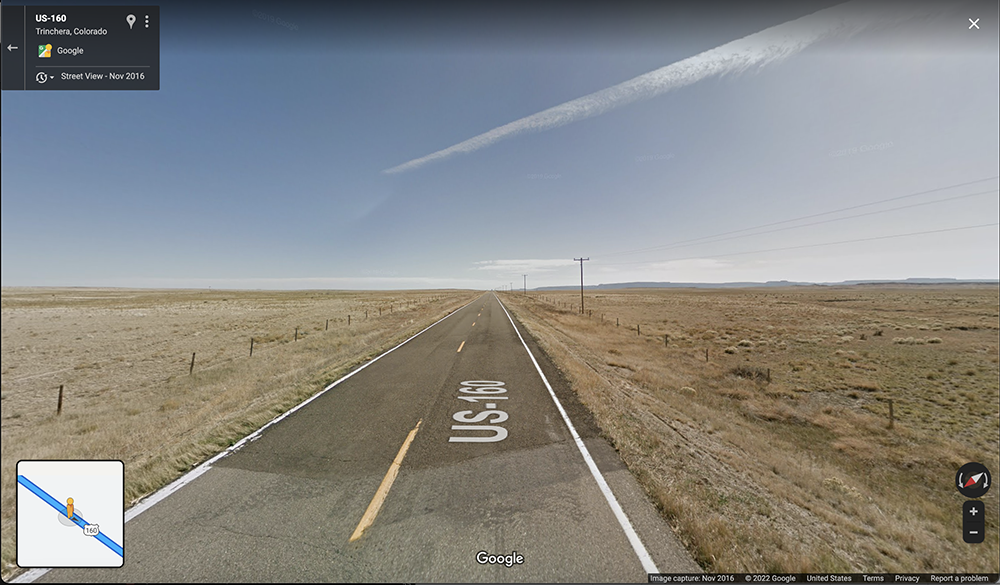

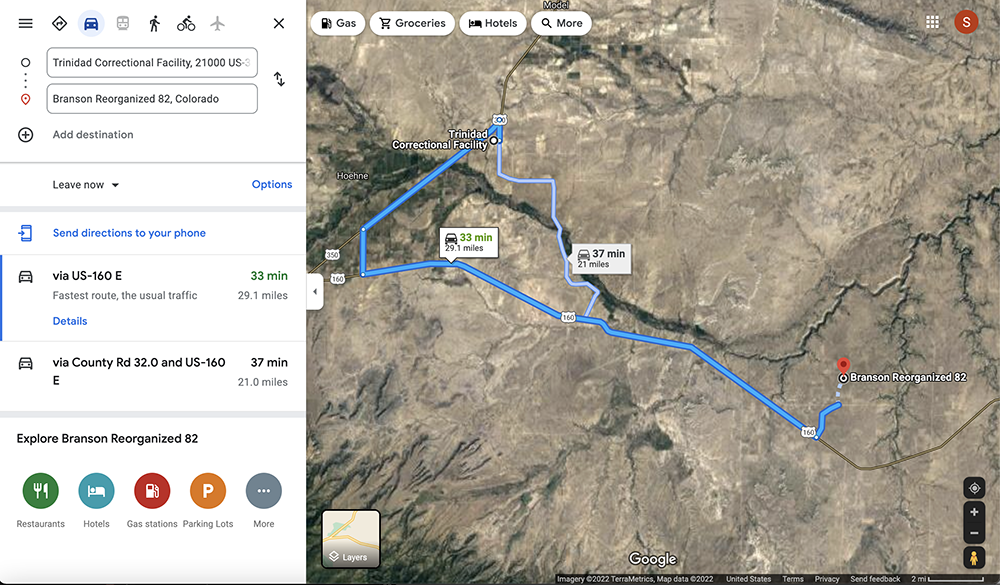

In [37]:
df_co.query("GEOCODE == 80439803001003")

# (38.4379, -105.152209) is ?? (there's a prison but not labeled on the map)
# https://www.google.com/maps/place/38%C2%B026'16.4%22N+105%C2%B009'08.0%22W/@38.4376815,-105.1537647,17z/data=!4m5!3m4!1s0x0:0xbdbb082ce34a0b46!8m2!3d38.4379!4d-105.152209

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65252,PLST,CO,80439803001003,43,980300,1,1003,236383,Block 1003,38.43796,-105.152209,399,399,399,399,399,0,80439803001003,Fremont,108,-291,108


In [38]:
df_co.query("GEOCODE == 80770009001082")

# (39.068713, -108.574237) is Mesa County Sheriff's Office
# https://www.google.com/maps/place/39%C2%B004'07.4%22N+108%C2%B034'27.3%22W/@39.068713,-108.5764257,697m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xc3a41c5a1e4dde08!8m2!3d39.068713!4d-108.574237

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
97664,PLST,CO,80770009001082,77,900,1,1082,56581,Block 1082,39.068713,-108.574237,391,391,391,391,391,0,80770009001082,Mesa,400,9,400


In [39]:
df_co.query("GEOCODE == 80439786004035")

# (38.439077, -105.237514) is ??? 
# https://www.google.com/maps/place/38%C2%B026'20.7%22N+105%C2%B014'15.1%22W/@38.439077,-105.2397027,703m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x9036a05ec249faa8!8m2!3d38.439077!4d-105.237514

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
64394,PLST,CO,80439786004035,43,978600,4,4035,109354,Block 4035,38.439077,-105.237514,336,336,336,336,336,0,80439786004035,Fremont,336,0,336


In [40]:
df_co.query("GEOCODE == 80310041101001")

# (39.767428, -104.864073) is Denver County Jail (very close to DRDC and Denver Womens Correctional)
# https://www.google.com/maps/place/39%C2%B046'02.7%22N+104%C2%B051'50.7%22W/@39.7675865,-104.867478,809m/data=!3m1!1e3!4m5!3m4!1s0x0:0x4712733944b8f139!8m2!3d39.767428!4d-104.864073

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
39277,PLST,CO,80310041101001,31,4110,1,1001,62538,Block 1001,39.767428,-104.864073,327,327,327,327,327,0,80310041101001,Denver,328,1,328


In [41]:
df_co.query("GEOCODE == 80439803001001")

# (38.429962, -105.144441) is FOUR MILE CORRECTIONAL CENTER
# https://www.google.com/maps/place/38%C2%B025'47.9%22N+105%C2%B008'40.0%22W/@38.429962,-105.146635,703m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xf6e56caff708cc10!8m2!3d38.429962!4d-105.144441

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65250,PLST,CO,80439803001001,43,980300,1,1001,397772,Block 1001,38.429962,-105.144441,297,297,297,297,297,0,80439803001001,Fremont,297,0,297


In [42]:
df_co.query("GEOCODE == 80130127071032")

# (40.033016, -105.231993) is Boulder County Jail
# https://www.google.com/maps/place/40%C2%B001'58.9%22N+105%C2%B013'55.2%22W/@40.033016,-105.234187,687m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x3075b68f911cb8b4!8m2!3d40.033016!4d-105.231993

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
20890,PLST,CO,80130127071032,13,12707,1,1032,175068,Block 1032,40.033016,-105.231993,296,296,295,295,295,0,80130127071032,Boulder,296,0,296


In [43]:
df_co.query("GEOCODE == 80350141232009")

# (39.403266, -104.864367) is Douglas County Sheriff's Office
# https://www.google.com/maps/place/39%C2%B024'11.8%22N+104%C2%B051'51.7%22W/@39.403266,-104.866561,693m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x965804bd0545889!8m2!3d39.403266!4d-104.864367

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
46158,PLST,CO,80350141232009,35,14123,2,2009,355752,Block 2009,39.403266,-104.864367,283,283,283,283,283,0,80350141232009,Douglas,283,0,283


In [44]:
df_co.query("GEOCODE == 80439803001011")

# (38.429938, -105.158878) is SKYLINE CORRECTIONAL CENTER
# https://www.google.com/maps/place/38%C2%B025'47.8%22N+105%C2%B009'32.0%22W/@38.429938,-105.161072,703m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xa0e7328e034f287a!8m2!3d38.429938!4d-105.158878

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65260,PLST,CO,80439803001011,43,980300,1,1011,45257,Block 1011,38.429938,-105.158878,248,248,248,248,248,0,80439803001011,Fremont,47,-201,47


In [45]:
df_co.query("GEOCODE == 81010035001001")

# (38.275473, -104.610928) is Pueblo County Detention
# https://www.google.com/maps/place/38%C2%B016'31.7%22N+104%C2%B036'39.3%22W/@38.275473,-104.613122,704m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xa7067f57254c965a!8m2!3d38.275473!4d-104.610928

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
120333,PLST,CO,81010035001001,101,3500,1,1001,19884,Block 1001,38.275473,-104.610928,223,223,223,223,223,0,81010035001001,Pueblo,223,0,223


In [46]:
df_co.query("GEOCODE == 80590114022001")

# (39.743599, -105.069213) is ??? an art school
# https://www.google.com/maps/place/39%C2%B044'37.0%22N+105%C2%B004'09.2%22W/@39.743599,-105.071407,690m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x32ed0091b71e231c!8m2!3d39.743599!4d-105.069213

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
77011,PLST,CO,80590114022001,59,11402,2,2001,355236,Block 2001,39.743599,-105.069213,1202,1202,1080,210,210,0,80590114022001,Jefferson,1226,24,1226


In [47]:
df_co.query("GEOCODE == 80439803001020")

# (38.429433, -105.147304) is also FOUR MILE CORRECTIONAL CENTER?
# https://www.google.com/maps/place/38%C2%B025'46.0%22N+105%C2%B008'50.3%22W/@38.429433,-105.1494927,703m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xccbd43418ff96a82!8m2!3d38.429433!4d-105.147304

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65269,PLST,CO,80439803001020,43,980300,1,1020,57522,Block 1020,38.429433,-105.147304,210,210,210,210,210,0,80439803001020,Fremont,-210,-420,-210


In [48]:
df_co.query("GEOCODE == 80410003022014")

# (38.892398, -104.821223) is ??
# https://www.google.com/maps/place/38%C2%B053'32.6%22N+104%C2%B049'16.4%22W/@38.892398,-104.8234117,698m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x6ae814c7bad98032!8m2!3d38.892398!4d-104.821223

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
51906,PLST,CO,80410003022014,41,302,2,2014,330449,Block 2014,38.892398,-104.821223,311,311,294,207,207,0,80410003022014,El Paso,339,28,339


In [49]:
df_co.query("GEOCODE == 80119667011032")

# (38.064694, -103.204791) is also BENT COUNTY CORRECTIONAL FACILITY
# https://www.google.com/maps/place/38%C2%B003'52.9%22N+103%C2%B012'17.3%22W/@38.064694,-103.2069797,706m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x60e0322bdbaaa3e2!8m2!3d38.064694!4d-103.204791

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
18717,PLST,CO,80119667011032,11,966701,1,1032,113581,Block 1032,38.064694,-103.204791,193,193,193,193,193,0,80119667011032,Bent,193,0,193


In [50]:
df_co.query("GEOCODE == 80770008012008")

# (39.063907, -108.561902) is Mesa County Criminal Justice / Work Release
# https://www.google.com/maps/place/39%C2%B003'50.1%22N+108%C2%B033'42.9%22W/@39.063907,-108.5640907,697m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x3ce91755270de9!8m2!3d39.063907!4d-108.561902

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
97392,PLST,CO,80770008012008,77,801,2,2008,15709,Block 2008,39.063907,-108.561902,189,189,189,189,189,0,80770008012008,Mesa,199,10,199


In [51]:
df_co.query("GEOCODE == 80459520032028")

# (39.648109, -107.777755) is RIFLE CORRECTIONAL CENTER
# https://www.google.com/maps/place/39%C2%B038'53.2%22N+107%C2%B046'39.9%22W/@39.6482473,-107.7804592,880m/data=!3m1!1e3!4m5!3m4!1s0x0:0x3a68f61f0d956de4!8m2!3d39.648109!4d-107.777755

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
66695,PLST,CO,80459520032028,45,952003,2,2028,365261,Block 2028,39.648109,-107.777755,187,187,187,187,187,0,80459520032028,Garfield,23,-164,23


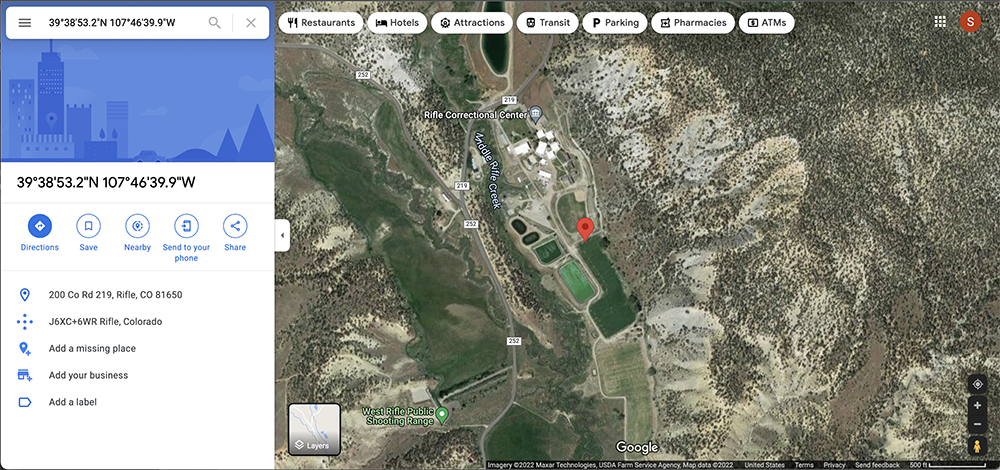

In [52]:
df_co.query("GEOCODE == 80439803001009")

# (38.422569, -105.16032) is 2nd block of FREMONT CORRECTIONAL FACILITY and/or CENTENNIAL CORRECTIONAL FACILITY
# https://www.google.com/maps/place/38%C2%B025'21.3%22N+105%C2%B009'37.2%22W/@38.422569,-105.1625087,703m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x580588cc0cdbb6f4!8m2!3d38.422569!4d-105.16032

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
65258,PLST,CO,80439803001009,43,980300,1,1009,155095,Block 1009,38.422569,-105.16032,185,185,185,185,185,0,80439803001009,Fremont,185,0,185


Note: CENTENNIAL CORRECTIONAL FACILITY is a Level V maximum security 
https://cdoc.colorado.gov/facilities/canon-city/centennial-correctional-facility

In [53]:
df_co.query("GEOCODE == 80010088023035")

# (39.84981, -104.923231) is Colorado State Patrol Office?
# https://www.google.com/maps/place/39%C2%B050'59.3%22N+104%C2%B055'23.6%22W/@39.84981,-104.9254197,689m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xe2f9943546cf6aaf!8m2!3d39.84981!4d-104.923231

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
5146,PLST,CO,80010088023035,1,8802,3,3035,589658,Block 3035,39.84981,-104.923231,195,195,190,173,173,0,80010088023035,Adams,209,14,209


In [54]:
df_co.query("GEOCODE == 81010003001005")

# (38.279812, -104.631593) is SAN CARLOS CORRECTIONAL FACILITY
# https://www.google.com/maps/place/38%C2%B016'47.3%22N+104%C2%B037'53.7%22W/@38.2797462,-104.6328283,281m/data=!3m1!1e3!4m5!3m4!1s0x0:0xce0ed05ae17df1c7!8m2!3d38.279812!4d-104.631593

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
115138,PLST,CO,81010003001005,101,300,1,1005,37969,Block 1005,38.279812,-104.631593,169,169,169,169,169,0,81010003001005,Pueblo,37,-132,37


In [55]:
df_co.query("GEOCODE == 80590101003006")

# (39.734806, -105.173065) is COLORADO CORRECTIONAL CENTER (CAMP GEORGE WEST) 
# https://www.google.com/maps/place/39%C2%B044'05.3%22N+105%C2%B010'23.0%22W/@39.7348353,-105.1749131,17.26z/data=!4m5!3m4!1s0x0:0xab31faf7abdc03af!8m2!3d39.734806!4d-105.173065

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
74692,PLST,CO,80590101003006,59,10100,3,3006,56373,Block 3006,39.734806,-105.173065,128,128,128,128,128,0,80590101003006,Jefferson,22,-106,22


Note on COLORADO CORRECTIONAL CENTER (CAMP GEORGE WEST): Google Maps has the location labeled as CO Department of Corrections but on closer inspection using Street View, one can see signs for CCC and Camp George West (as well as a tank)

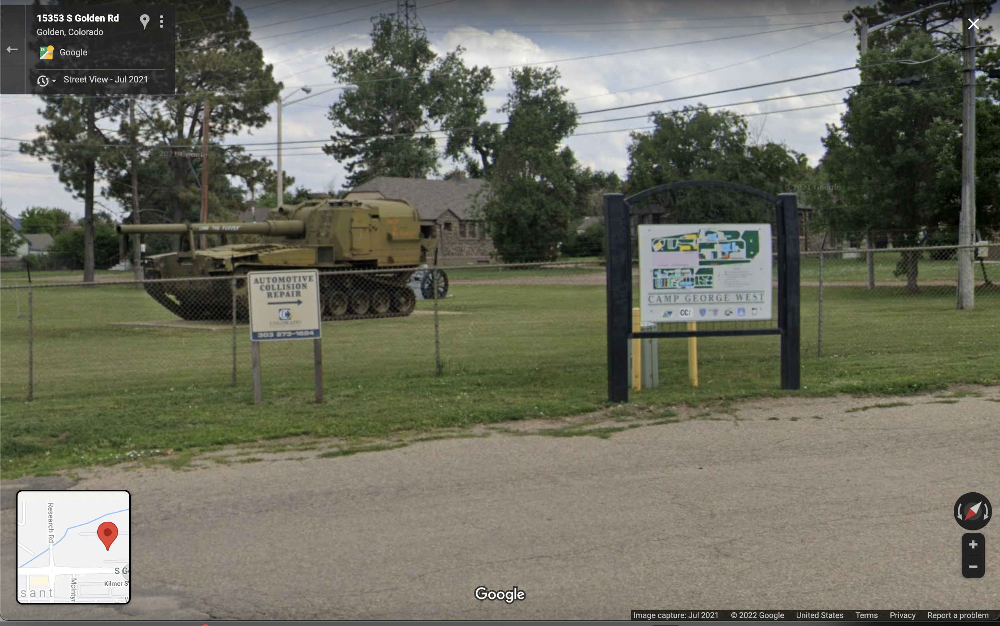

In [56]:
df_co.query("GEOCODE == 81230006001007")

# (40.450863, -104.700804) is Weld County Justice Services
# https://www.google.com/maps/place/40%C2%B027'03.1%22N+104%C2%B042'02.9%22W/@40.450863,-104.7029927,704m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x23f8bffed36a93!8m2!3d40.450863!4d-104.700804

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
130431,PLST,CO,81230006001007,123,600,1,1007,182776,Block 1007,40.450863,-104.700804,127,127,127,127,127,0,81230006001007,Weld,127,0,127


In [57]:
df_co.query("GEOCODE == 81219242002002")

# (40.159996, -103.193436) is Washington County Sheriff Department / Washington County Justice Center
# https://www.google.com/maps/place/40%C2%B009'36.0%22N+103%C2%B011'36.4%22W/@40.159996,-103.1956247,17z/data=!3m1!4b1!4m5!3m4!1s0x0:0x45c7c7f5d5c2e51d!8m2!3d40.159996!4d-103.193436

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
129890,PLST,CO,81219242002002,121,924200,2,2002,208161,Block 2002,40.159996,-103.193436,127,127,127,127,127,0,81219242002002,Washington,127,0,127


In [58]:
df_co.query("GEOCODE == 80050055513009")

# (39.655713, -105.028728) is a community center? 
# https://www.google.com/maps/place/39%C2%B039'20.6%22N+105%C2%B001'43.4%22W/@39.655713,-105.0309167,17z/data=!3m1!4b1!4m5!3m4!1s0x0:0x920b5ed4c965468d!8m2!3d39.655713!4d-105.028728

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
9297,PLST,CO,80050055513009,5,5551,3,3009,51037,Block 3009,39.655713,-105.028728,158,158,142,116,116,0,80050055513009,Arapahoe,174,16,174


In [59]:
df_co.query("GEOCODE == 80590109021005")

# (39.737354, -105.126011) is ??
# https://www.google.com/maps/place/39%C2%B044'14.5%22N+105%C2%B007'33.6%22W/@39.737354,-105.128205,17z/data=!3m1!4b1!4m5!3m4!1s0x0:0x6268d77fda9cf035!8m2!3d39.737354!4d-105.126011

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
76543,PLST,CO,80590109021005,59,10902,1,1005,243278,Block 1005,39.737354,-105.126011,115,115,114,114,114,0,80590109021005,Jefferson,125,10,125


In [60]:
df_co.query("GEOCODE == 80310041013003")

# (39.78197, -104.935721) is Correctional Management Inc. (CMI) - Dahlia facility
# https://www.google.com/maps/place/39%C2%B046'55.1%22N+104%C2%B056'08.6%22W/@39.78197,-104.9379097,711m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0x328b7456a3e2f145!8m2!3d39.78197!4d-104.935721

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
38727,PLST,CO,80310041013003,31,4101,3,3003,228559,Block 3003,39.78197,-104.935721,120,120,120,120,112,0,80310041013003,Denver,129,9,129


In [61]:
df_co.query("GEOCODE == 80679711001022")

# (37.247968, -107.877924) is La Plata County Jail
# https://www.google.com/maps/place/37%C2%B014'52.7%22N+107%C2%B052'40.5%22W/@37.247968,-107.880118,737m/data=!3m2!1e3!4b1!4m5!3m4!1s0x0:0xf0f98844b1e368b4!8m2!3d37.247968!4d-107.877924

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
84765,PLST,CO,80679711001022,67,971100,1,1022,538852,Block 1022,37.247968,-107.877924,113,113,111,110,110,0,80679711001022,La Plata,114,1,114


In [62]:
df_co_readme

,Facility,County,Total
0,ARKANSAS VALLEY CORRECTIONAL FACILITY,Crowley,"1,059"
1,ARROWHEAD CORRECTIONAL CENTER,Fremont,513
2,BENT COUNTY CORRECTIONAL FACILITY,Bent,"1,382"
3,BUENA VISTA CORRECTIONAL COMPLEX,Chaffee,908
4,BUENA VISTA MINIMUM CENTER,Chaffee,290
5,BUENA VISTA TRANSITIONAL WORK CENTER,Chaffee,10
6,CENTENNIAL CORRECTIONAL FACILITY,Fremont,403
7,COLORADO CORRECTIONAL CENTER (CAMP GEORGE WEST),Jefferson,123
8,COLORADO STATE PENITENTIARY,Fremont,706
9,COLORADO TERRITORIAL CORRECTIONAL FACILITY,Fremont,910


##### Trying to Find the Location in Google Maps of the remainding facilities to match to GEOCODE

BUENA VISTA CORRECTIONAL COMPLEX (DOC: 908), BUENA VISTA MINIMUM CENTER (DOC: 290), and BUENA VISTA TRANSITIONAL WORK CENTER (DOC: 10) might be all in the same census block as the Census has the prison population and block as 1190 and the three combined DOC counts total to be 1208

In [63]:
df_co.query("GEOCODE == 80150004021064")

,FILEID,STUSAB,GEOCODE,COUNTY,TRACT,BLKGRP,BLOCK,AREALAND,NAME,INTPTLAT,INTPTLON,P0010001,P0020001,P0030001,P0050001,P0050003,P0050004,GEOID20,county_name,TOTALPOP_ADJ,dif_pop,adjpop
27389,PLST,CO,80150004021064,15,402,1,1064,212354,Block 1064,38.817104,-106.118779,1190,1190,1190,1190,1190,0,80150004021064,Chaffee,188,-1002,188


PAROLE FACILITY CCC is part of CCC (COLORADO CORRECTIONAL CENTER)

PAROLE FACILITY DWCF is part of DENVER WOMENS CORRECTIONAL FACILITY

YOUTHFUL OFFENDER SYSTEM-PUEBLO
https://www.google.com/maps/place/Youthful+Offender+System/@38.2786313,-104.6280737,517m/data=!3m1!1e3!4m5!3m4!1s0x0:0x4e390043c1a3a87a!8m2!3d38.278729!4d-104.628014

##### README Edited with GEOCODES for facilities that could match

In [64]:
df_co_readme2 = pd.read_csv("..//data//handmade//readmes//co-readme-incarcerated-persons-adjustments-08-06-2021_w_blocks.csv", encoding="utf-8")
# df_co_readme2

In [65]:
df_co_readme2 = df_co_readme2.drop(columns=['Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10'])
df_co_readme2

,Facility,County,DOC Total,GEOCODE 2,GEOCODE,Census_pop,adjpop,dif_pop
0,ARKANSAS VALLEY CORRECTIONAL FACILITY,Crowley,"1,059",8.025970e+13,NaN,1063.0,201.0,-862.0
1,ARROWHEAD CORRECTIONAL CENTER,Fremont,513,8.043980e+13,NaN,512.0,88.0,-424.0
2,BENT COUNTY CORRECTIONAL FACILITY,Bent,"1,382",8.011967e+13,8.011967e+13,1224.0,73.0,-1151.0
3,BUENA VISTA CORRECTIONAL COMPLEX (merged with ...,Chaffee,908,8.015000e+13,NaN,1208.0,188.0,-1002.0
4,BUENA VISTA MINIMUM CENTER,Chaffee,290,NaN,NaN,NaN,NaN,NaN
5,BUENA VISTA TRANSITIONAL WORK CENTER,Chaffee,10,NaN,NaN,NaN,NaN,NaN
6,CENTENNIAL CORRECTIONAL FACILITY,Fremont,403,8.043980e+13,NaN,185.0,185.0,0.0
7,COLORADO CORRECTIONAL CENTER (CAMP GEORGE WEST),Jefferson,123,8.059010e+13,NaN,128.0,22.0,-106.0
8,COLORADO STATE PENITENTIARY,Fremont,706,8.043980e+13,NaN,705.0,149.0,-556.0
9,COLORADO TERRITORIAL CORRECTIONAL FACILITY,Fremont,910,8.043980e+13,NaN,564.0,-165.0,-729.0
